#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [ ]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
# !git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 5437, done.
remote: Total 5437 (delta 0), reused 0 (delta 0), pack-reused 5437
Receiving objects: 100% (5437/5437), 8.07 MiB | 35.91 MiB/s, done.
Resolving deltas: 100% (3717/3717), done.
/content/yolov5


In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 645kB 18.5MB/s 
Setup complete. Using torch 1.8.0+cu101 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
dataset_base = "/content/drive/MyDrive/dataset/people/"

data_yaml = dataset_base + "data.yaml"

dataset_yolo = dataset_base + "yolo/"
pretrained = "/content/drive/MyDrive/od_models/yolov5/yolov5m.pt"

trained_custom = "/content/drive/MyDrive/dataset/people/best_m.pt"

test_path = dataset_yolo + "test/images"

In [ ]:
!unzip -u "{dataset_base}yolo.zip" -d "{dataset_base}"

Archive:  /content/drive/MyDrive/dataset/people/yolo.zip
   creating: /content/drive/MyDrive/dataset/people/yolo/
   creating: /content/drive/MyDrive/dataset/people/yolo/test/
   creating: /content/drive/MyDrive/dataset/people/yolo/test/images/
  inflating: /content/drive/MyDrive/dataset/people/yolo/test/images/PennPed00036.jpg  
  inflating: /content/drive/MyDrive/dataset/people/yolo/test/images/PennPed00036_-5_aug.jpg  
  inflating: /content/drive/MyDrive/dataset/people/yolo/test/images/PennPed00036_5_aug.jpg  
  inflating: /content/drive/MyDrive/dataset/people/yolo/test/images/PennPed00036_blue_100_aug.jpg  
  inflating: /content/drive/MyDrive/dataset/people/yolo/test/images/PennPed00036_contrast_10_aug.jpg  
  inflating: /content/drive/MyDrive/dataset/people/yolo/test/images/PennPed00043.jpg  
  inflating: /content/drive/MyDrive/dataset/people/yolo/test/images/PennPed00043_-5_aug.jpg  
  inflating: /content/drive/MyDrive/dataset/people/yolo/test/images/PennPed00043_5_aug.jpg  
  in

In [ ]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat "{data_yaml}"

train: /content/drive/MyDrive/dataset/people/yolo/train/images
val: /content/drive/MyDrive/dataset/people/yolo/test/images

nc: 1
names: ['person']

# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [ ]:
# define number of classes based on YAML
import yaml
with open(data_yaml, 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
#this is the model configuration we will use for our tutorial 
%cat /content/yolov5/models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.05  # model depth multiple
width_multiple: 0.20  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
# !python train.py --img 416 --batch 16 --epochs 100 --data "{data_yaml}" --cfg ./models/custom_yolov5s.yaml --weights runs/train/yolov5s_results3/weights/best.pt --name yolov5s_results  --cache
!python train.py --img 320 --batch 32 --epochs 100 --data "{data_yaml}" --cfg ./models/custom_yolov5s.yaml --weights runs/train/people_results7/weights/best.pt --name people_results  --cache

/content/yolov5
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v4.0-138-ged2c742 torch 1.8.0+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, batch_size=32, bucket='', cache_images=True, cfg='./models/custom_yolov5s.yaml', data='/content/drive/MyDrive/dataset/people/data.yaml', device='', entity=None, epochs=100, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[320, 320], linear_lr=False, local_rank=-1, log_artifacts=False, log_imgs=16, multi_scale=False, name='people_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/people_results9', single_cls=False, sync_bn=False, total_batch_size=32, weights='runs/train/people_results7/weights/best.pt', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/train", view at http://localhost:6006/
2021-03-21 12:38:03.020304: I tensorflow/stream_executo

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [ ]:
trained_custom = "/content/yolov5/runs/train/people_results9/weights/best.pt"

In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights "{trained_custom}" --img 320 --conf 0.4 --source "{test_path}"

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=320, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='/content/drive/MyDrive/dataset/people/yolo/test/images', update=False, view_img=False, weights=['/content/yolov5/runs/train/people_results9/weights/best.pt'])
YOLOv5 🚀 v4.0-138-ged2c742 torch 1.8.0+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 196 layers, 1124102 parameters, 0 gradients, 2.9 GFLOPS
image 1/135 /content/drive/MyDrive/dataset/people/yolo/test/images/PennPed00036.jpg: 320x320 2 persons, Done. (0.007s)
image 2/135 /content/drive/MyDrive/dataset/people/yolo/test/images/PennPed00036_-5_aug.jpg: 320x320 1 person, Done. (0.007s)
image 3/135 /content/drive/MyDrive/dataset/people/yolo/test/images/PennPed00036_5_aug.jpg: 320x320 2 persons, Done. (0.006s)
image 4/135 /content/drive/MyDrive/dataset/people/yolo/test/images/PennPed00036_blu

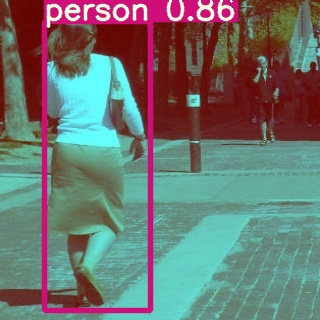

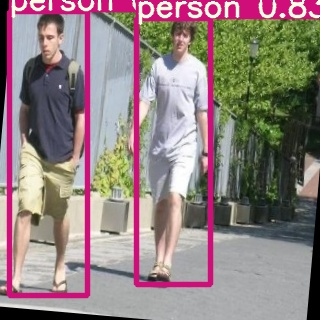

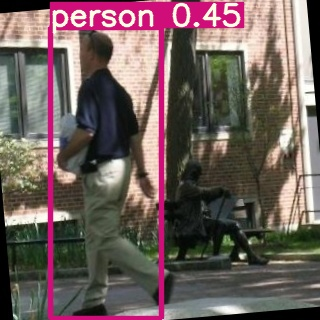

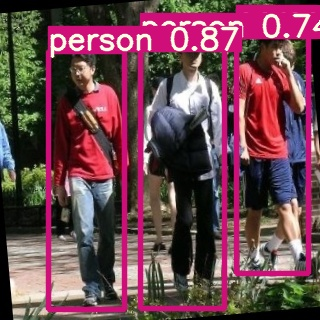

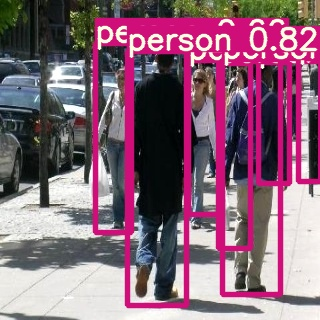

...

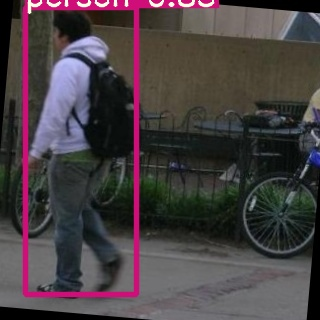

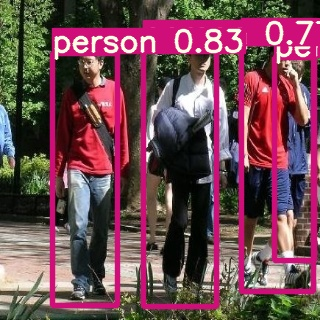

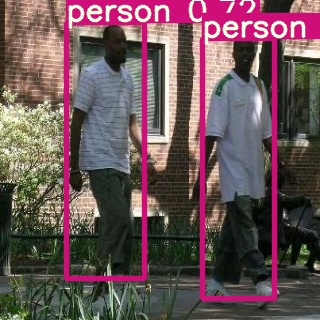

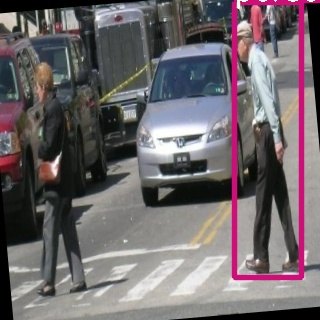

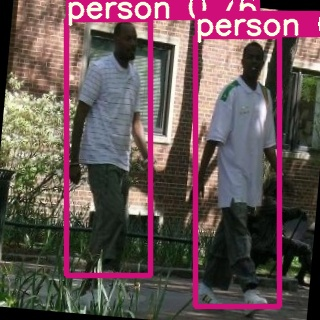

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp8/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")